# Diverse tests - Classifier Free Guidance Tests - UWM pushT - Sampling Experiments

Diagnostic notebook for the **pushT `horizon_aware=False`** (purely-causal) UWM
checkpoint. Everything operates on tokenizer latents. After a shared setup it
runs two families of sampling experiments:

- **Part I — Classifier-free guidance.** A `getVelField` primitive returning the
  flow-matching velocity at a given cleanness, used to build unconditional video
  generation, goal-anchored generation, and a classifier-free-guidance weight
  sweep that blends unconditional and context-conditioned velocities.

- **Part II — Horizon sampling: batch-mode vs autoregressive.** Condition on a
  few clean context frames and generate the future horizon two ways — denoising
  the whole horizon in parallel (batch mode) vs a KV-cached frame-by-frame
  rollout (`HybridChunkSampler`) — scored against the ground-truth continuation.

**Convention.** The denoiser is an *x-predictor* at cleanness `tau`
(`tau=0` → pure noise, `tau=1` → clean). The flow-matching velocity is
`v = (x_hat - x) / (1 - tau)`, integrated with forward Euler over `K` steps.
Noise levels are passed to the model as quantized indices in
`[0, num_noise_levels - 1]`.

## 1. Setup

In [1]:
%load_ext autoreload
%autoreload 2
import math
import torch
import numpy as np
import mediapy
import matplotlib.pyplot as plt
from torch.nn.functional import interpolate

from hydra import initialize, compose
from omegaconf import OmegaConf

from dreamerv4uwm.models.utils import load_tokenizer, load_denoiser
from dreamerv4uwm.datasets import G1ChunkDataset, ShardedHDF5Dataset
from dreamerv4uwm.sampling_new import make_is_horizon, _quantize_tau_to_idx
from dreamerv4uwm.inference.hybrid_chunk import HybridChunkSampler

torch.manual_seed(0)  # reproducible noise priors
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
resolution = (256, 256)

## 2. Config & checkpoints

`pushT-large` matches this checkpoint's architecture (`model_dim=1024`,
`n_layers=8`). We override `horizon_aware=false` because the checkpoint was
trained without the `frame_id_embedder` / horizon-aware temporal mask.

In [2]:
with initialize(version_base=None, config_path='../scripts/config'):
    cfg = compose(
        config_name='dynamics/pushT-large',
        overrides=['denoiser.horizon_aware=false'],
    )

cfg.dynamics_ckpt = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/blockcausal/pushT-post-train/97500.pt'
cfg.tokenizer_ckpt = '/home/mim-server/projects/rooholla/dreamerV4-UWM/checkpoints/tokenizer/pushT.pt'

print('horizon_aware:', cfg.denoiser.get('horizon_aware', False))
print('model_dim / n_layers:', cfg.denoiser.model_dim, '/', cfg.denoiser.n_layers)

horizon_aware: False
model_dim / n_layers: 1024 / 8


/home/mim-server/miniconda3/envs/dreamerv4uwm/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'dynamics/pushT-large': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


## 3. Load denoiser + tokenizer

In [3]:
denoiser = load_denoiser(cfg, device, max_num_forward_steps=300).eval().cuda()
tokenizer = load_tokenizer(cfg, device, max_num_forward_steps=300).eval().cuda()

# None for this checkpoint; a DiscreteEmbedder(2, model_dim) when horizon_aware=true.
print('frame_id_embedder:', denoiser.model.frame_id_embedder)

frame_id_embedder: None


## 4. Held-out window → latents

Load one fixed 64-frame window from the held-out loader and encode its frames
to tokenizer latents `(1, T, N_lat=256, D_lat=32)`.

In [4]:
DATA_PATH = '/home/mim-server/datasets/pushT/h5/play'
dataset = ShardedHDF5Dataset(
    data_dir=DATA_PATH, window_size=64, stride=1,
    split='train', train_fraction=0.9, split_seed=123,
)

batch = dataset[1234]  # fixed index for reproducibility
imgs = interpolate(batch['image'], resolution).to(device)[None]          # (1, T, 3, 256, 256)
actions = batch['action'][:, :cfg.denoiser.n_actions][None].to(device)   # (1, T, n_act)

with torch.no_grad(), torch.autocast(device_type='cuda', dtype=torch.bfloat16):
    latents = tokenizer.encode(imgs)                                     # (1, T, N_lat, D_lat)
latents = latents.float()  # samplers integrate in fp32 for numerical headroom
print('imgs:', tuple(imgs.shape), '| actions:', tuple(actions.shape), '| latents:', tuple(latents.shape))

Train split: 64694 windows from 11 episodes
imgs: (1, 64, 3, 256, 256) | actions: (1, 64, 2) | latents: (1, 64, 256, 32)


## 5. Display & scoring helpers

`plotVideo` plays a clip; `plotSnapshots` / `plotComparison` render filmstrips;
`decode` maps latents back to images; `latent_mse` scores against ground truth.

In [5]:
def plotVideo(video, fps=10):
    """Play a (T, C, H, W) float[0,1] clip inline."""
    arr = (video.cpu().permute(0, 2, 3, 1).to(torch.float32).numpy() * 255).clip(0, 255).astype(np.uint8)
    mediapy.show_video(arr, fps=fps)


def _strip(video_tchw, n_frames=8, border=2):
    """(T, C, H, W) float[0,1] -> horizontal uint8 filmstrip of `n_frames` samples."""
    T = video_tchw.shape[0]
    idx = np.linspace(0, T - 1, min(n_frames, T), dtype=int)
    fr = (video_tchw[idx].cpu().permute(0, 2, 3, 1).to(torch.float32).numpy() * 255).clip(0, 255).astype(np.uint8)
    H, W, C = fr.shape[1:]
    sep = np.full((H, border, C), 255, np.uint8)
    parts = []
    for i, f in enumerate(fr):
        if i:
            parts.append(sep)
        parts.append(f)
    return np.concatenate(parts, axis=1)


def plotSnapshots(video, n_frames=8, figsize=None):
    """Show a single clip as one filmstrip row."""
    strip = _strip(video, n_frames)
    figsize = figsize or (n_frames * 2, 2.2)
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(strip); ax.axis('off'); plt.tight_layout(); plt.show()


def plotComparison(named_videos, n_frames=8, title=None):
    """Stack labeled clips as filmstrip rows for side-by-side comparison.

    Args:
        named_videos: list of (label, video) with video shaped (T, C, H, W) in [0, 1].
        n_frames: frames sampled per row.
        title: optional figure title above the top row.
    """
    rows = [(lab, _strip(v, n_frames)) for lab, v in named_videos]
    fig, axes = plt.subplots(len(rows), 1, figsize=(n_frames * 2, 2.0 * len(rows)))
    if len(rows) == 1:
        axes = [axes]
    for ax, (lab, img) in zip(axes, rows):
        ax.imshow(img); ax.set_xticks([]); ax.set_yticks([])
        ax.set_ylabel(lab, rotation=0, ha='right', va='center', fontsize=10)
    if title:
        axes[0].set_title(title, fontsize=12)
    plt.tight_layout(); plt.show()


def plotActions(actions, dim_labels=None, ylim=(-1.0, 1.0)):
    """Line-plot each action dimension over time."""
    act = actions.cpu().float().numpy() if hasattr(actions, 'cpu') else np.array(actions)
    fig, ax = plt.subplots(1, 1, figsize=(8, 3))
    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    for d in range(act.shape[-1]):
        ax.plot(act[:, d], linewidth=1.2, alpha=0.85,
                label=dim_labels[d] if dim_labels else f'dim {d}')
    ax.set_ylim(*ylim); ax.legend(fontsize=9, loc='upper right')
    plt.tight_layout(); plt.show()


@torch.no_grad()
def decode(lat):
    """Decode latents (B, T, N_lat, D_lat) -> video (B, T, 3, H, W) float[0,1]."""
    with torch.autocast(device_type='cuda', dtype=torch.bfloat16):
        v = tokenizer.decode(lat.to(device))
    return v.float().clamp(0, 1)


def latent_mse(x, y):
    """Mean-squared error between two latent tensors (broadcast-compatible)."""
    return torch.mean((x.float() - y.float()) ** 2).item()

## 6. Context / horizon split

The first `T_ctx` frames are the clean conditioning context; the next `T_hor`
frames are the ground-truth continuation used for scoring in Part II.

In [6]:
T_ctx = 8       # conditioning frames
T_hor = 32      # ground-truth horizon length used for scoring

ctx_latents = latents[:, :T_ctx].clone()
ctx_actions = actions[:, :T_ctx].clone()
gt_horizon  = latents[:, T_ctx:T_ctx + T_hor].clone()
print('ctx:', tuple(ctx_latents.shape), '| gt_horizon:', tuple(gt_horizon.shape))

ctx: (1, 8, 256, 32) | gt_horizon: (1, 32, 256, 32)


# Part I — Classifier-free guidance

We build the velocity-field primitive used for **classifier-free guidance (CFG)**:
run the denoiser twice per step — once unconditional, once conditioned on a clean
anchor frame — and blend the two velocities

```
v = v_uncond + w * (v_cond - v_uncond)
```

where `w` is the guidance strength (`w=0` → unconditional, larger `w` → push
harder toward the conditioned distribution).

## 7. Velocity-field building block — `getVelField`

One denoiser query at cleanness `tau` returning the x-prediction and the
flow-matching velocity `v = (x_hat - x) / (1 - tau)` for the horizon frames.
An optional clean `context` block (held at `context_tau`) can be concatenated
before or after the horizon so the horizon attends to it. This single primitive
backs unconditional, context-conditioned, and CFG sampling.

In [7]:
@torch.no_grad()
def getVelField(denoiser, z, tau, context=None, context_tau=0.9, context_at_end=False):
    """Query the denoiser once at cleanness ``tau``; return (x_pred, velocity)
    for the horizon frames ``z``.

    Args:
        denoiser: DenoiserWrapper.
        z: horizon latents being integrated (1, T_hor, N_lat, D_lat).
        tau: current cleanness in [0, 1) (0 = pure noise).
        context: optional clean latents (1, T_ctx, N_lat, D_lat) to condition on.
        context_tau: cleanness pinned on the context frames (~1 = clean).
        context_at_end: append context after the horizon instead of before
            (use a *future* anchor, i.e. goal-conditioning).

    Returns:
        (x, v): x-prediction and velocity, both sliced back to the horizon
        frames only — shapes (1, T_hor, N_lat, D_lat).
    """
    d = denoiser.cfg.denoiser
    N, n_act = d.num_noise_levels, d.n_actions
    device = z.device
    # Assemble the attended sequence (horizon +/- context).
    if context is None:
        z_t = z
    elif context_at_end:
        z_t = torch.cat([z, context], dim=1)
    else:
        z_t = torch.cat([context, z], dim=1)
    T = z_t.shape[1]
    is_hor = make_is_horizon(T, all_bidir=True, device=device)         # ignored when horizon_aware=false
    a = torch.randn(1, T, n_act, device=device)
    step_idx = torch.zeros((1, T), dtype=torch.long, device=device)
    obs_sigma = torch.full((1, T), _quantize_tau_to_idx(tau, N), dtype=torch.long, device=device)
    act_sigma = torch.full((1, T), _quantize_tau_to_idx(0.0, N), dtype=torch.long, device=device)
    if context is not None:                                            # pin context frames clean
        Tc = context.shape[1]
        ctx_idx = _quantize_tau_to_idx(context_tau, N)
        if context_at_end:
            obs_sigma[:, -Tc:] = ctx_idx
        else:
            obs_sigma[:, :Tc] = ctx_idx
    z_hat, _, _ = denoiser(
        noisy_act=a, noisy_obs=z_t,
        obs_sigma_idx=obs_sigma, obs_step_idx=step_idx,
        act_sigma_idx=act_sigma, act_step_idx=step_idx, is_horizon=is_hor,
    )
    v = (z_hat - z_t) / (1.0 - tau)
    x = z_hat
    if context is None:
        return x, v
    return (x[:, :-Tc], v[:, :-Tc]) if context_at_end else (x[:, Tc:], v[:, Tc:])

## 8. Unconditional video generation — `videoSampler`

Integrate a horizon from pure noise to clean with full bidirectional attention
and no conditioning. Returns the final x-prediction latents.

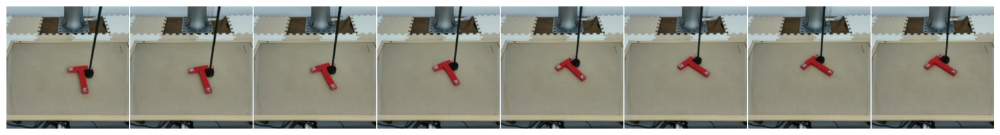

In [8]:
@torch.no_grad()
def videoSampler(denoiser, num_diffusion_steps, video_length=16):
    """Unconditional generation via flow-matching Euler integration.

    Args:
        denoiser: DenoiserWrapper.
        num_diffusion_steps: number of Euler steps K.
        video_length: number of frames to generate.

    Returns:
        Final x-prediction latents (1, video_length, N_lat, D_lat).
    """
    d = denoiser.cfg.denoiser
    N, N_lat, D_lat, n_act = d.num_noise_levels, d.num_latent_tokens, d.latent_dim, d.n_actions
    device = next(denoiser.parameters()).device
    is_hor = make_is_horizon(video_length, all_bidir=True, device=device)
    z = torch.randn(1, video_length, N_lat, D_lat, device=device)     # prior (tau=0)
    a = torch.randn(1, video_length, n_act, device=device)
    K = int(num_diffusion_steps)
    step_idx = torch.zeros((1, video_length), dtype=torch.long, device=device)
    act_sigma = torch.full((1, video_length), _quantize_tau_to_idx(0.0, N), dtype=torch.long, device=device)
    obs_sigma = torch.zeros((1, video_length), dtype=torch.long, device=device)
    dt = 1.0 / K
    for k in range(K):
        cur = k / K
        obs_sigma[:] = _quantize_tau_to_idx(cur, N)
        z_hat, _, _ = denoiser(
            noisy_act=a, noisy_obs=z,
            obs_sigma_idx=obs_sigma, obs_step_idx=step_idx,
            act_sigma_idx=act_sigma, act_step_idx=step_idx, is_horizon=is_hor,
        )
        z = z + (z_hat - z) / (1.0 - cur) * dt
    return z_hat


z_uncond = videoSampler(denoiser, num_diffusion_steps=16, video_length=8)
plotSnapshots(decode(z_uncond)[0], n_frames=8)

In [9]:
###
# z = videoSampler(denoiser, 16, 8)
with torch.no_grad():
    img_vid = tokenizer.decode(z_uncond)

plotVideo(img_vid[0].to(torch.float32))

## 9. Context-conditioned (goal-anchored) generation

Use `getVelField` with `context_at_end=True`: a single clean *future* frame
anchors the generation, and the model fills in the frames leading up to it.

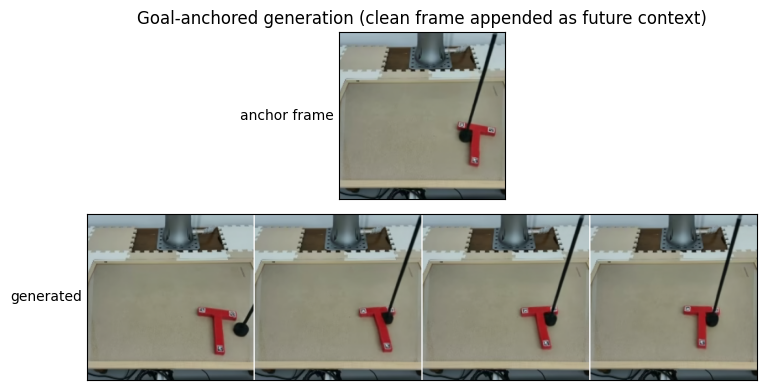

In [10]:
video_length, n_steps = 4, 32
N_lat, D_lat = cfg.denoiser.num_latent_tokens, cfg.denoiser.latent_dim

z_t = torch.randn(1, video_length, N_lat, D_lat, device=device)
context = latents[:, 10:11].clone()   # one clean frame used as a future anchor
dt = 1.0 / n_steps
for k in range(n_steps):
    tau = k / n_steps
    x, v = getVelField(denoiser, z_t, tau, context=context, context_tau=0.8, context_at_end=True)
    z_t = z_t + v * dt

img_vid = decode(x)[0]
context_vid = decode(context)[0]

plotComparison([
    ('anchor frame', context_vid),
    ('generated', img_vid),
], n_frames=8, title='Goal-anchored generation (clean frame appended as future context)')

In [11]:
plotVideo(img_vid.to(torch.float32))
plotVideo(context_vid.to(torch.float32))

In [12]:
# ###
# video_length=4
# n_steps = 32
# dt = 1./float(n_steps)
# z_t = torch.randn(1, video_length, 256, 32, device=device, dtype=torch.float32)
# context = latents[:, 10, ...].clone().unsqueeze(1)  # (1, 1, 256, 32)


# for k in range(n_steps):
#     tau = k/n_steps
#     x, v = getVelField(denoiser, z_t, tau, context=context, context_tau=0.8, context_at_end=True)
#     z_t = z_t + v*dt


# with torch.no_grad():
#     img_vid = tokenizer.decode(x)
#     context_vid = tokenizer.decode(context)

# plotVideo(img_vid[0].to(torch.float32))
# plotVideo(context_vid[0].to(torch.float32))

## 10. Classifier-free guidance — weight sweep

Blend the unconditional and context-conditioned velocities at several guidance
strengths `w`. The conditioning anchor is the first clean frame.

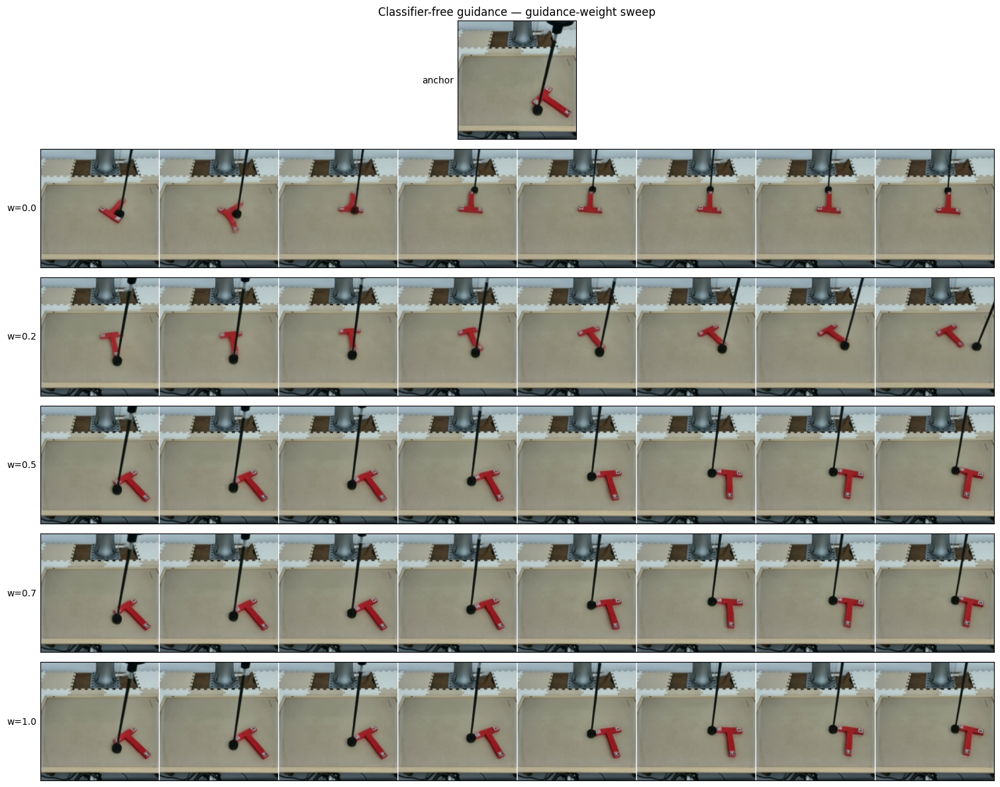

In [13]:
video_length, n_steps = 8, 8
N_lat, D_lat = cfg.denoiser.num_latent_tokens, cfg.denoiser.latent_dim
context = latents[:, 0:1].clone()     # first frame as the conditioning anchor


@torch.no_grad()
def cfg_sample(denoiser, context, w, video_length=8, n_steps=8, seed=0):
    """Classifier-free-guided generation at guidance strength ``w``.

    Each step blends v = v_uncond + w * (v_cond - v_uncond). Returns the
    integrated (guided) latents (1, video_length, N_lat, D_lat).
    """
    torch.manual_seed(seed)  # same prior across w for a fair comparison
    d = denoiser.cfg.denoiser
    device = context.device
    z_t = torch.randn(1, video_length, d.num_latent_tokens, d.latent_dim, device=device)
    dt = 1.0 / n_steps
    for k in range(n_steps):
        tau = k / n_steps
        _, v_un = getVelField(denoiser, z_t, tau)                                  # unconditional
        _, v_co = getVelField(denoiser, z_t, tau, context=context, context_tau=1.0)  # conditioned
        v = v_un + w * (v_co - v_un)
        z_t = z_t + v * dt
    return z_t


rows = [('anchor', decode(context)[0])]
for w in [0.0, 0.2, 0.5, 0.7, 1.0]:
    z_w = cfg_sample(denoiser, context, w, video_length, n_steps)
    rows.append((f'w={w}', decode(z_w)[0]))
plotComparison(rows, n_frames=8, title='Classifier-free guidance — guidance-weight sweep')

In [14]:
w = 0.5
z_w = cfg_sample(denoiser, context, w, video_length, n_steps)
plotVideo(decode(z_w)[0].to(torch.float32))

In [15]:
# ###
# video_length=8
# n_steps = 8

# w = 0.7
# dt = 1./float(n_steps)
# z_t = torch.randn(1, video_length, 256, 32, device=device, dtype=torch.float32)
# context = latents[:, 0, ...].clone().unsqueeze(1)  # (1, 1, 256, 32)

# for k in range(n_steps):
#     tau = k/n_steps
#     x_uncon, v_uncon = getVelField(denoiser, z_t, tau)
#     x_con, v_con = getVelField(denoiser, z_t, tau, context=context, context_tau=1.0, context_at_end=False)
    
#     v = v_uncon + w*(v_con-v_uncon)
#     z_t[:] = z_t + v*dt


# with torch.no_grad():
#     img_vid = tokenizer.decode(x_uncon)
#     img_vid_con = tokenizer.decode(context)

# plotVideo(img_vid_con[0].to(torch.float32))
# plotVideo(img_vid[0].to(torch.float32))


# Part II — Horizon sampling: batch-mode vs autoregressive

Condition on the clean context frames from the split above (§6) and generate the
future horizon two ways, scoring each against the ground-truth continuation:

1. **Batch mode** — denoise the entire horizon in parallel (one forward pass per
   flow-matching step). Cheap; drifts as the horizon grows.
2. **Autoregressive** — KV-cached frame-by-frame rollout via `HybridChunkSampler`.
   `chunk_size=1` is in-distribution for this checkpoint; `chunk_size>1` uses
   bidirectional-within-chunk attention the model never saw at training time (OOD).

## 11. Samplers

Two factored, self-contained samplers. `batch_sample` denoises the whole horizon
at once; `ar_rollout` wraps `HybridChunkSampler` for KV-cached rollout. Both read
their dims from the denoiser config, so they take only tensors as input.

In [16]:
@torch.no_grad()
def batch_sample(denoiser, ctx_z, ctx_a, T_hor, K=32, B=1, ctx_tau=1.0):
    """Generate a full horizon in parallel via flow matching, context-conditioned.

    Every Euler step is a single forward pass over ``[context | horizon]``: the
    context frames are pinned clean so the horizon attends to them, while the
    horizon frames integrate from pure noise (tau=0) to clean (tau=1).

    Args:
        denoiser: DenoiserWrapper (carries cfg + dims).
        ctx_z: clean context latents (1, T_ctx, N_lat, D_lat).
        ctx_a: clean context actions (1, T_ctx, n_act).
        T_hor: horizon length to generate.
        K: number of flow-matching Euler steps.
        B: number of independent samples (different noise) from the same context.
        ctx_tau: cleanness assigned to the context frames (~1 = clean).

    Returns:
        (z, a): horizon latents (B, T_hor, N_lat, D_lat) and actions (B, T_hor, n_act).
    """
    d = denoiser.cfg.denoiser
    N, N_lat, D_lat, n_act = d.num_noise_levels, d.num_latent_tokens, d.latent_dim, d.n_actions
    device = ctx_z.device
    Tc = ctx_z.shape[1]
    ctx_z = ctx_z.expand(B, -1, -1, -1).contiguous()
    ctx_a = ctx_a.expand(B, -1, -1).contiguous()
    z = torch.randn(B, T_hor, N_lat, D_lat, device=device)   # horizon prior (tau=0)
    a = torch.randn(B, T_hor, n_act, device=device)
    T = Tc + T_hor
    step_idx = torch.zeros((B, T), dtype=torch.long, device=device)   # shortcut step (flow mode -> 0)
    is_hor = make_is_horizon(T, ctx_len=Tc, device=device)            # ignored when horizon_aware=false
    ctx_idx = _quantize_tau_to_idx(ctx_tau, N)
    cur, dt = 0.0, 1.0 / K
    for _ in range(K):
        z_in = torch.cat([ctx_z, z], dim=1)                           # re-attach clean context
        a_in = torch.cat([ctx_a, a], dim=1)
        sig = torch.full((B, T), _quantize_tau_to_idx(cur, N), dtype=torch.long, device=device)
        sig[:, :Tc] = ctx_idx                                         # keep context clean
        z_hat, a_hat, _ = denoiser(
            noisy_act=a_in, noisy_obs=z_in,
            obs_sigma_idx=sig, obs_step_idx=step_idx,
            act_sigma_idx=sig, act_step_idx=step_idx, is_horizon=is_hor,
        )
        zh, ah = z_hat[:, Tc:], a_hat[:, Tc:].squeeze(-2)             # horizon slice only
        denom = max(1.0 - cur, 1e-5)                                  # v = (x_hat - x) / (1 - tau)
        z = z + (zh - z) / denom * dt
        a = a + (ah - a) / denom * dt
        cur += dt
    return z, a


@torch.no_grad()
def ar_rollout(denoiser, cfg, ctx_z, ctx_a, n_frames, chunk_size=1, commit=1, K=8):
    """KV-cached autoregressive rollout via HybridChunkSampler.

    Warms the cache on the context frames, then emits ``n_frames`` of horizon
    ``commit`` frames at a time.

    Args:
        denoiser, cfg: model wrapper and full Hydra config.
        ctx_z, ctx_a: clean context latents/actions to warm the cache with.
        n_frames: total horizon frames to generate.
        chunk_size: frames denoised per chunk (m). 1 = pure causal decode
            (in-distribution here); >1 = bidirectional-within-chunk (OOD for a
            horizon_aware=false checkpoint).
        commit: frames committed to cache per chunk (k <= chunk_size).
        K: denoising steps per chunk.

    Returns:
        (z, a): latents (1, n_frames, N_lat, D_lat) and actions (1, n_frames, n_act).
    """
    s = HybridChunkSampler(
        denoiser, cfg, chunk_size=chunk_size, commit_per_chunk=commit,
        num_diffusion_steps=K, device='cuda', dtype=torch.float32,
    )
    s.suppress_horizon_warning = True
    s.init_cache(batch_size=ctx_z.shape[0])
    s.warm_up_cache(ctx_z, ctx_a)              # commit clean context into the KV cache
    return s.generate(n_frames)

## 12. Batch mode — horizon-length sweep

Generate horizons of growing length from the same context and watch the
latent MSE grow as the parallel denoise has to commit a longer trajectory.

In [17]:
# shape context (ctx_latents)
print('ctx_latents:', tuple(ctx_latents.shape))

ctx_latents: (1, 8, 256, 32)


[batch] horizon= 8 


[batch] horizon=16 


[batch] horizon=32 


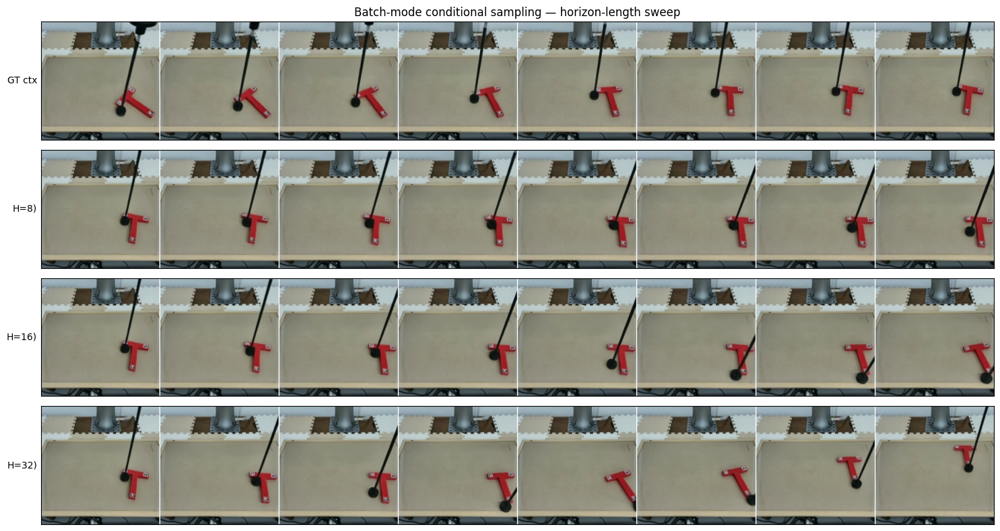

In [18]:
batch_videos = [('GT ctx', decode(ctx_latents)[0])]
for Th in [8, 16, 32]:
    z, _ = batch_sample(denoiser, ctx_latents, ctx_actions, Th, K=32, B=1)
    # m = latent_mse(z, latents[:, T_ctx:T_ctx + Th])
    print(f'[batch] horizon={Th:2d} ') # latent_mse_vs_GT={m:.4f}
    batch_videos.append((f'H={Th})', decode(z)[0])) #  (mse={m:.3f}
    plotVideo(decode(z)[0].to(torch.float32))

plotComparison(batch_videos, n_frames=8, title='Batch-mode conditional sampling — horizon-length sweep')

## 13. Batch mode — sample diversity

Same context, four different noise priors. Plausible but distinct pusher
trajectories indicate genuine diversity (no mode collapse).

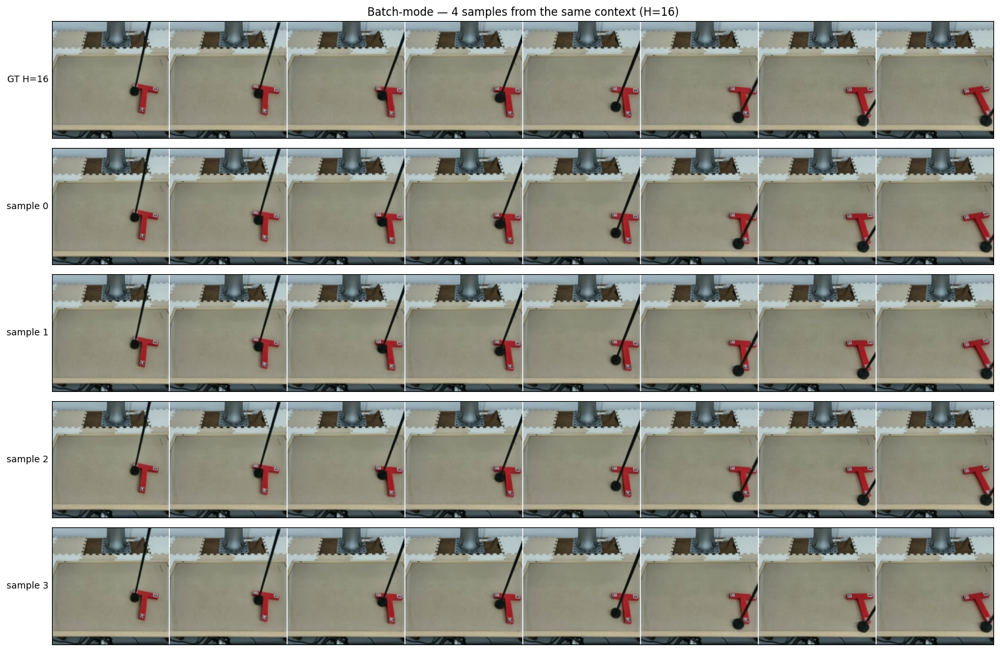

In [19]:
z, _ = batch_sample(denoiser, ctx_latents, ctx_actions, T_hor=16, K=32, B=4)
vids = decode(z)
diversity = [('GT H=16', decode(latents[:, T_ctx:T_ctx + 16])[0])]
diversity += [(f'sample {i}', vids[i]) for i in range(4)]
plotComparison(diversity, n_frames=8, title='Batch-mode — 4 samples from the same context (H=16)')

## 14. Autoregressive rollout

In-distribution single-frame decode (`m=1`) vs the OOD chunked variant (`m=4`),
both KV-cached and warmed on the same context.

/tmp/ipykernel_1029414/3743975980.py:72: RuntimeWarning: [HybridChunkSampler] cfg.denoiser.horizon_aware=False — the model was trained with purely-causal temporal attention. This sampler uses bidirectional attention within the active chunk, which the model has NOT been trained on. Predictions are out-of-distribution and quality may degrade significantly. To use this sampler as intended, train (or fine-tune) with horizon_aware=True. Override with cfg.denoiser.horizon_aware=True or set self.suppress_horizon_warning=True to silence.
  s = HybridChunkSampler(


[HybridChunkSampler] cfg.denoiser.horizon_aware=False — the model was trained with purely-causal temporal attention. This sampler uses bidirectional attention within the active chunk, which the model has NOT been trained on. Predictions are out-of-distribution and quality may degrade significantly. To use this sampler as intended, train (or fine-tune) with horizon_aware=True. Override with cfg.denoiser.horizon_aware=True or set self.suppress_horizon_warning=True to silence.


[HybridChunkSampler] cfg.denoiser.horizon_aware=False — the model was trained with purely-causal temporal attention. This sampler uses bidirectional attention within the active chunk, which the model has NOT been trained on. Predictions are out-of-distribution and quality may degrade significantly. To use this sampler as intended, train (or fine-tune) with horizon_aware=True. Override with cfg.denoiser.horizon_aware=True or set self.suppress_horizon_warning=True to silence.
[AR] m=1 (in-dist)


[AR] m=4 (OOD)


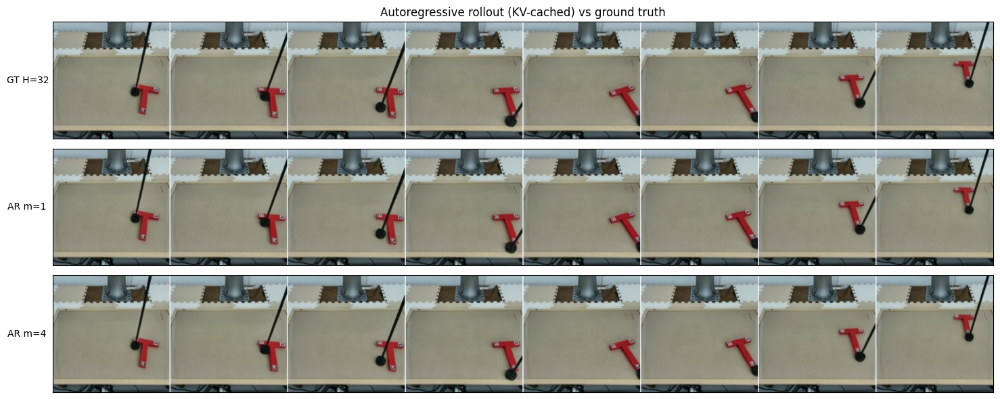

In [20]:
z_ar1, _ = ar_rollout(denoiser, cfg, ctx_latents, ctx_actions, T_hor, chunk_size=1, commit=1, K=8)
z_ar4, _ = ar_rollout(denoiser, cfg, ctx_latents, ctx_actions, T_hor, chunk_size=4, commit=4, K=16)

# m1 = latent_mse(z_ar1[:, :T_hor], gt_horizon)
# m4 = latent_mse(z_ar4[:, :T_hor], gt_horizon)
print(f'[AR] m=1 (in-dist)') #  mse={m1:.4f}
plotVideo(decode(z_ar1)[0].to(torch.float32))
print(f'[AR] m=4 (OOD)') #       mse={m4:.4f}
plotVideo(decode(z_ar4)[0].to(torch.float32))

plotComparison([
    ('GT H=32', decode(gt_horizon)[0]),
    (f'AR m=1 ', decode(z_ar1[:, :T_hor])[0]), # (mse={m1:.3f})
    (f'AR m=4 ', decode(z_ar4[:, :T_hor])[0]), # (mse={m4:.3f})
], n_frames=8, title='Autoregressive rollout (KV-cached) vs ground truth')

## 15. Play a rollout

In [21]:
# Inline video of the in-distribution autoregressive rollout.
plotVideo(decode(z_ar1[:, :T_hor])[0], fps=8)

# Part III — Policy mode `p(a_t | o_t)`: diversity for planning

The MCTS in Part IV uses the model as a generative prior `pi_prior`: tree **edges
are short rollouts** sampled from it. A tree can only *search* if those edges
**differ** — a deterministic policy gives one child per node and the search
collapses to a single rollout. So before planning we characterize the policy
marginal `p(a_t | o_t)` and ask: **what makes it diverse, and does that diversity
survive into the world-model's state predictions?**

Policy mode = the **action-pretraining corner** of the UWM: clean observation
context, horizon **state held at pure noise** (we don't claim to know the
future), horizon **action integrated** from its noise prior to clean. All three
rollout primitives live in `dreamerv4uwm.planning.rollout` and share the same
diversity knobs (`ctx_noise`, `ctx_noise_honest`, `action_temp`, `K`):

- `R.policy`     — `p(a|o)` (actions only; state stays noise).
- `R.transition` — world model `s,a -> s'` (actions given & clean; state integrates).
- `R.imagine`    — joint `(a, o')` rollout (both integrate) = the MCTS edge generator.


In [22]:
from dreamerv4uwm.planning import rollout as R

# --- lightweight knobs (dial up for final figures) --------------------------
N_SAMPLES = 64      # action/rollout samples per estimate
K_STEPS   = 10      # Euler steps per rollout


def make_state(t0, Tc=T_ctx):
    """(ctx_z, ctx_a, gt_next_action) for a decision at frame t0+Tc."""
    cz = latents[:, t0:t0 + Tc].clone()
    ca = actions[:, t0:t0 + Tc].clone()
    gt = actions[:, t0 + Tc].clone()                    # (1, n_act) dataset action
    return cz, ca, gt


def gaussian_entropy(samples):
    """Differential entropy (nats) of a Gaussian fit to samples (B, d)."""
    x = samples.detach().cpu().double()
    d = x.shape[1]
    cov = torch.cov(x.T).reshape(d, d) + 1e-9 * torch.eye(d, dtype=torch.double)
    return 0.5 * (d * math.log(2 * math.pi * math.e) + torch.linalg.slogdet(cov)[1].item())


def summarize_actions(a):
    """Diversity stats for action samples (B, d)."""
    x = a.detach().cpu()
    std = x.std(0)
    idx = torch.randperm(x.shape[0])[:min(256, x.shape[0])]
    xs = x[idx]
    mpd = torch.cdist(xs, xs).sum() / (xs.shape[0] * (xs.shape[0] - 1) + 1e-9)
    return dict(std=std.numpy(), trace_std=float(std.norm()),
                entropy=gaussian_entropy(x), mpd=float(mpd))


def latent_spread(z):
    """Scalar: mean over (frames, tokens, dims) of the per-sample std of z (B,H,N,D)."""
    return z.std(0).mean().item()


def plot_clouds(clouds, gt=None, ax=None, title=None):
    """Scatter 2-D action clouds; star = dataset action."""
    own = ax is None
    if own:
        fig, ax = plt.subplots(figsize=(5, 5))
    for lab, c in clouds.items():
        ax.scatter(c[:, 0], c[:, 1], s=12, alpha=0.45, label=lab)
    if gt is not None:
        ax.scatter([gt[0]], [gt[1]], c='k', marker='*', s=220, label='dataset $a_t$', zorder=5)
    ax.set_xlabel('action[0]'); ax.set_ylabel('action[1]')
    ax.legend(fontsize=8); ax.grid(alpha=.3)
    if title:
        ax.set_title(title)
    if own:
        plt.tight_layout(); plt.show()

print('planning rollout primitives loaded;  N_SAMPLES=%d  K_STEPS=%d' % (N_SAMPLES, K_STEPS))

planning rollout primitives loaded;  N_SAMPLES=64  K_STEPS=10


## 16. Context-noise injection → action diversity

**The first idea: inject noise into the observation context and see if the
policy gets more diverse (higher entropy).** Two regimes:

- **honest** (`ctx_noise_honest=True`): the context's `sigma_idx` is set to the
  *true* noised cleanness, so the model *knows* the state is uncertain — a
  principled widening of the posterior `p(a | noisy o)`.
- **mismatched** (`False`): the context is corrupted but announced clean. This
  is out-of-distribution and tends to *distort* rather than cleanly diversify.

Same action prior (`seed` fixed) across levels, so differences reflect the
*conditioning*, not sampling noise.


ctx_noise=0.00  H_honest=-11.22  H_mismatch=-11.22
ctx_noise=0.15  H_honest=-10.02  H_mismatch=-9.93
ctx_noise=0.30  H_honest=-8.57  H_mismatch=-8.46
ctx_noise=0.50  H_honest=-6.88  H_mismatch=-6.92


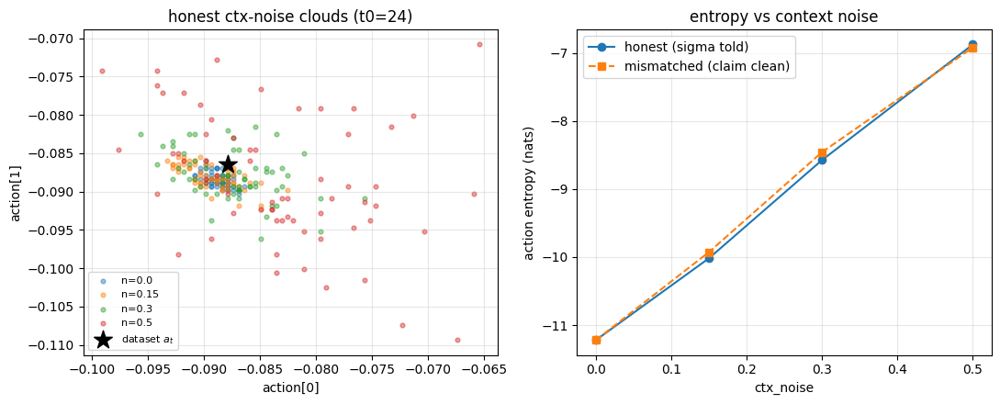

In [23]:
t0 = 24
cz, ca, gt = make_state(t0)
NOISES = [0.0, 0.15, 0.3, 0.5]

clouds_h, ent_h, ent_m = {}, [], []
for n in NOISES:
    g = torch.Generator(device=device).manual_seed(0)
    a_h = R.policy(denoiser, cz, ca, H=1, B=N_SAMPLES, K=K_STEPS,
                   ctx_noise=n, ctx_noise_honest=True, generator=g)[:, 0]
    g = torch.Generator(device=device).manual_seed(0)
    a_m = R.policy(denoiser, cz, ca, H=1, B=N_SAMPLES, K=K_STEPS,
                   ctx_noise=n, ctx_noise_honest=False, generator=g)[:, 0]
    clouds_h[f'n={n}'] = a_h.cpu().numpy()
    ent_h.append(summarize_actions(a_h)['entropy'])
    ent_m.append(summarize_actions(a_m)['entropy'])
    print(f'ctx_noise={n:.2f}  H_honest={ent_h[-1]:+.2f}  H_mismatch={ent_m[-1]:+.2f}')

fig, ax = plt.subplots(1, 2, figsize=(11, 4.5))
plot_clouds(clouds_h, gt=gt[0].cpu().numpy(), ax=ax[0], title=f'honest ctx-noise clouds (t0={t0})')
ax[1].plot(NOISES, ent_h, 'o-', label='honest (sigma told)')
ax[1].plot(NOISES, ent_m, 's--', label='mismatched (claim clean)')
ax[1].set_xlabel('ctx_noise'); ax[1].set_ylabel('action entropy (nats)')
ax[1].legend(); ax[1].grid(alpha=.3); ax[1].set_title('entropy vs context noise')
plt.tight_layout(); plt.show()

## 17. Action-prior temperature

Flow matching transports the prior `N(0, I)` into `p(a|o)`; scaling the prior
std is a temperature-like control. `std != 1` is mildly OOD (the model only saw
std-1 priors at training), so watch for distortion rather than clean spreading.


action_temp=0.5  entropy=-11.36
action_temp=1.0  entropy=-11.22
action_temp=1.5  entropy=-11.11
action_temp=2.0  entropy=-10.86


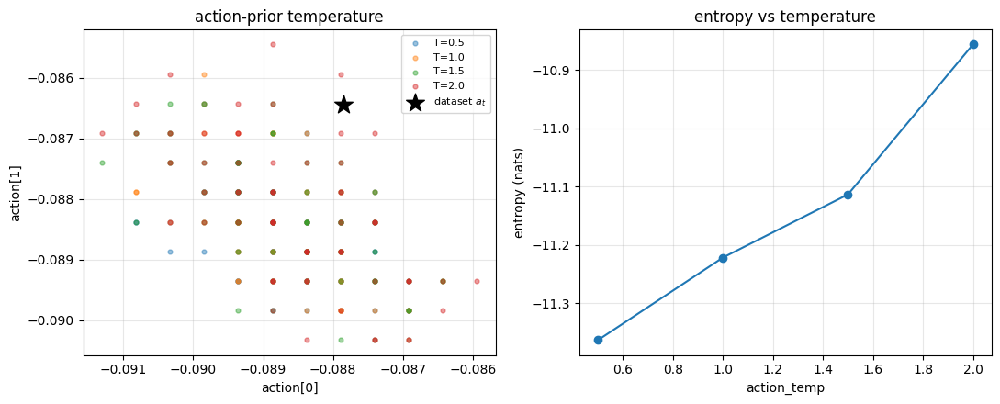

In [24]:
TEMPS = [0.5, 1.0, 1.5, 2.0]
clouds_t, ent_t = {}, []
for s in TEMPS:
    g = torch.Generator(device=device).manual_seed(0)
    a = R.policy(denoiser, cz, ca, H=1, B=N_SAMPLES, K=K_STEPS,
                 action_temp=s, generator=g)[:, 0]
    clouds_t[f'T={s}'] = a.cpu().numpy()
    ent_t.append(summarize_actions(a)['entropy'])
    print(f'action_temp={s}  entropy={ent_t[-1]:+.2f}')

fig, ax = plt.subplots(1, 2, figsize=(11, 4.5))
plot_clouds(clouds_t, gt=gt[0].cpu().numpy(), ax=ax[0], title='action-prior temperature')
ax[1].plot(TEMPS, ent_t, 'o-'); ax[1].set_xlabel('action_temp')
ax[1].set_ylabel('entropy (nats)'); ax[1].grid(alpha=.3)
ax[1].set_title('entropy vs temperature')
plt.tight_layout(); plt.show()

## 18. Downstream **state** coverage — the diversity that matters

Action entropy is not the planning target: diverse actions that lead to the
**same state** give the tree nothing to choose between. The right metric is the
spread of the *imagined states* an edge ensemble reaches. Here we sample
`B` **joint** rollouts (`R.imagine`, `H` frames) at several `ctx_noise` levels
and compare:

- **action spread** `|std|` of the rollout actions, and
- **latent state spread** (per-sample std of the imagined latents),

normalized to their `n=0` values. If state spread lags far behind action
spread, the world model is **contracting** diverse actions back onto one
trajectory — i.e. low controllable diversity, and a warning that MCTS will have
little to search over at this state.


ctx_noise=0.00  action|std|=0.0069  latent_spread=0.0296
ctx_noise=0.15  action|std|=0.0071  latent_spread=0.0296
ctx_noise=0.30  action|std|=0.0092  latent_spread=0.0311
ctx_noise=0.50  action|std|=0.0211  latent_spread=0.0411
ctx_noise=0.70  action|std|=0.0835  latent_spread=0.0854


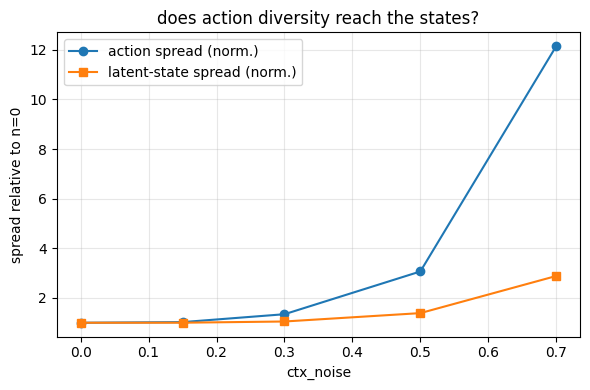

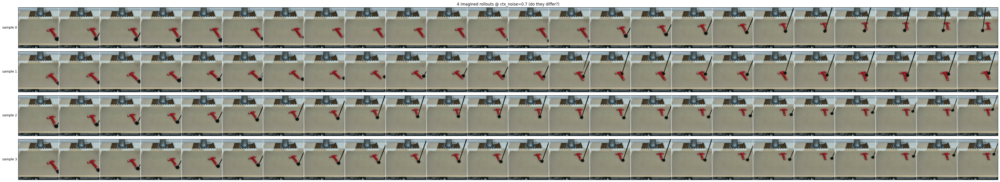

In [25]:
H_ROLL = 24
cov_noise = [0.0, 0.15, 0.3, 0.5, 0.7]
a_spread, z_spread = [], []
for n in cov_noise:
    g = torch.Generator(device=device).manual_seed(1)
    z, a = R.imagine(denoiser, cz, ca, H=H_ROLL, B=N_SAMPLES, K=K_STEPS,
                     ctx_noise=n, generator=g)
    a_spread.append(float(a.std(0).norm(dim=-1).mean()))   # mean over frames of |std|
    z_spread.append(latent_spread(z))
    print(f'ctx_noise={n:.2f}  action|std|={a_spread[-1]:.4f}  latent_spread={z_spread[-1]:.4f}')

a0, z0 = a_spread[0] + 1e-9, z_spread[0] + 1e-9
plt.figure(figsize=(6, 4))
plt.plot(cov_noise, [x / a0 for x in a_spread], 'o-', label='action spread (norm.)')
plt.plot(cov_noise, [x / z0 for x in z_spread], 's-', label='latent-state spread (norm.)')
plt.xlabel('ctx_noise'); plt.ylabel('spread relative to n=0')
plt.legend(); plt.grid(alpha=.3); plt.title('does action diversity reach the states?')
plt.tight_layout(); plt.show()

# eyeball: decode 4 imagined rollouts at the highest noise level
g = torch.Generator(device=device).manual_seed(2)
z, _ = R.imagine(denoiser, cz, ca, H=H_ROLL, B=4, K=K_STEPS, ctx_noise=cov_noise[-1], generator=g)
plotComparison([(f'sample {i}', decode(z[i:i+1])[0]) for i in range(4)],
               n_frames=H_ROLL, title=f'4 imagined rollouts @ ctx_noise={cov_noise[-1]} (do they differ?)')

## 19. Mode coverage across states

A Gaussian entropy number hides whether `p(a|o)` is a single blob or genuinely
multi-modal (e.g. *push left* vs *push right* around the T). Scatter the raw
2-D action cloud at a few states with a touch of honest context noise to expose
structure; overlay the dataset action.


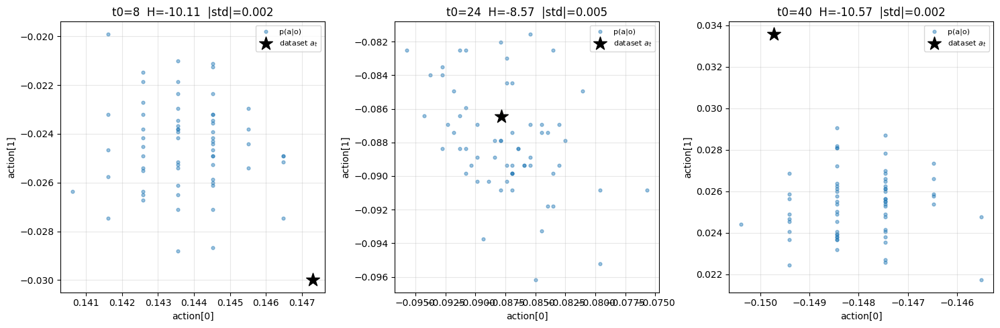

In [26]:
STATES = [8, 24, 40]
fig, axes = plt.subplots(1, len(STATES), figsize=(5 * len(STATES), 5))
for ax, t0s in zip(np.atleast_1d(axes), STATES):
    czs, cas, gts = make_state(t0s)
    g = torch.Generator(device=device).manual_seed(0)
    a = R.policy(denoiser, czs, cas, H=1, B=N_SAMPLES, K=K_STEPS,
                 ctx_noise=0.3, generator=g)[:, 0]
    s = summarize_actions(a)
    plot_clouds({'p(a|o)': a.cpu().numpy()}, gt=gts[0].cpu().numpy(), ax=ax,
                title=f't0={t0s}  H={s["entropy"]:+.2f}  |std|={s["trace_std"]:.3f}')
plt.tight_layout(); plt.show()

# Part IV — MCTS planning over world-model states

`dreamerv4uwm.planning.mcts.MCTS`. **Nodes are states** (a latent obs/action
history the denoiser conditions on); **edges are short `pi_prior` rollouts**
(`R.imagine`, `horizon` frames). Applying an edge advances the context to a
child node; a basic pluggable latent reward scores states.

Because actions are continuous and edges are *sampled*:
- **Progressive widening** — a node visited `n` times is allowed
  `ceil(pw_c * n^pw_alpha)` children, revealed one at a time from a candidate
  **pool** drawn in a single batched `imagine` call (amortizes the forward).
- **UCB** selection with `sqrt(N_parent)/(1+N_child)` exploration and min/max
  value normalization (rewards are an arbitrary negative-distance scale).
- **Leaf value** = its terminal reward (already in the edge return), optionally
  bootstrapped by short imagined simulations (`value_rollouts`).

The diversity knobs from Part III are forwarded to the edge sampler — **this is
where Part III feeds Part IV**: `ctx_noise` / `action_temp` set how much the
tree can branch.


## 20. A planning problem: reach a goal configuration

Reward = negative latent L2 to a **goal frame** (a target configuration the
pusher should reach). Pick a start state and a goal a few frames ahead.


In [32]:
print(latents.shape, actions.shape)
print(T_ctx)

torch.Size([1, 64, 256, 32]) torch.Size([1, 64, 2])
8


reward(start state) = -7.466   (0 == at goal)


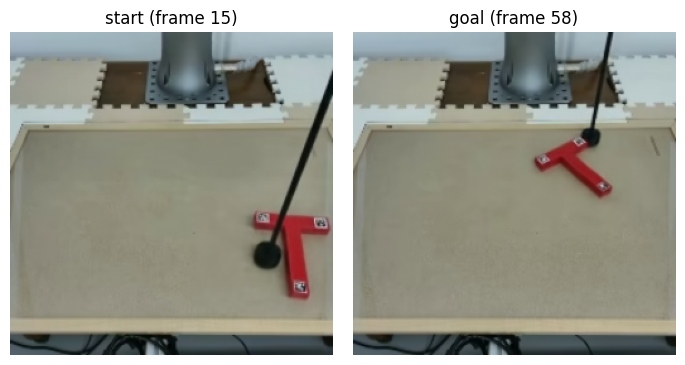

In [33]:
from dreamerv4uwm.planning import GoalLatentReward, MCTS, PlanConfig

PLAN_T0    = 8
GOAL_FRAME = 58
plan_cz = latents[:, PLAN_T0:PLAN_T0 + T_ctx].clone()
plan_ca = actions[:, PLAN_T0:PLAN_T0 + T_ctx].clone()
goal_z  = latents[:, GOAL_FRAME].clone()            # (1, N_lat, D_lat)
reward  = GoalLatentReward(goal_z, scale=0.01, metric='l2')

print('reward(start state) = %.3f   (0 == at goal)' % reward(plan_cz[:, -1]).item())
fig, ax = plt.subplots(1, 2, figsize=(7, 3.6))
ax[0].imshow(decode(plan_cz[:, -1:])[0, 0].permute(1, 2, 0).cpu().numpy())
ax[0].axis('off'); ax[0].set_title(f'start (frame {PLAN_T0 + T_ctx - 1})')
ax[1].imshow(decode(goal_z[None])[0, 0].permute(1, 2, 0).cpu().numpy())
ax[1].axis('off'); ax[1].set_title(f'goal (frame {GOAL_FRAME})')
plt.tight_layout(); plt.show()

## 21. Run the search

In [34]:
import time

pcfg = PlanConfig(
    horizon=4, pool_size=8, K_steps=6,        # edges: 4-frame rollouts, 8 candidates/node
    n_simulations=48, max_depth=4, gamma=0.98, c_ucb=1.0,
    ctx_noise=0.5, action_temp=1.5,           # diversity so the tree can branch (Part III)
    value_rollouts=0, max_ctx=24,
)
planner = MCTS(denoiser, reward, pcfg, seed=0)
t = time.time()
out = planner.plan(plan_cz, plan_ca, verbose=True)
print(f'\nplanned in {time.time() - t:.1f}s  | edge-sampler forwards = {out["n_forward"]}')
print('root children (visits, Q):', [(n, round(q, 3)) for n, q in out['root_child_stats']])
print('best first action chunk:', out['a_seq'].cpu().numpy().round(3).tolist())

  sim   9/48  root children=3  forwards=7
  sim  18/48  root children=4  forwards=12
  sim  27/48  root children=5  forwards=19
  sim  36/48  root children=6  forwards=26
  sim  45/48  root children=6  forwards=31

planned in 59.0s  | edge-sampler forwards = 31
root children (visits, Q): [(8, -62.781), (8, -63.105), (8, -62.91), (8, -62.903), (8, -62.872), (8, -62.825)]
best first action chunk: [[0.14300000667572021, -0.03200000151991844], [0.12600000202655792, 0.019999999552965164], [0.1459999978542328, 0.0689999982714653], [0.057999998331069946, 0.08399999886751175]]


## 22. Visualize the planned trajectory

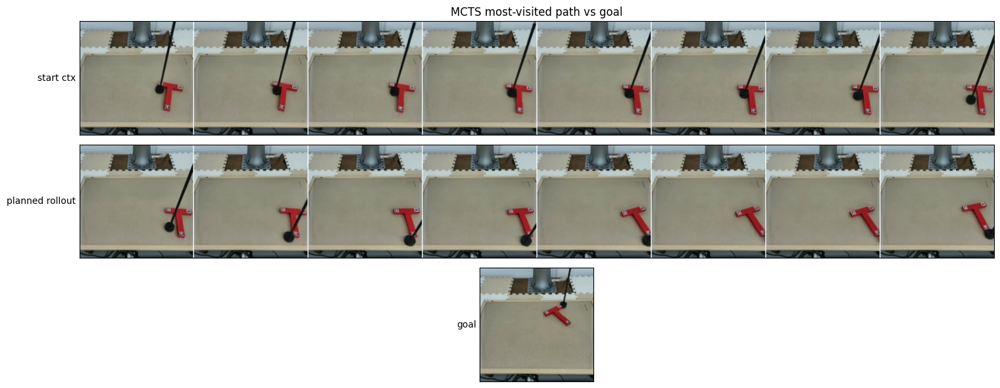

planned terminal reward = -5.6512
random  terminal reward = -5.6642 ± 0.0417  (n=16)
gain over random = +0.0130


In [ ]:
path = out['best_path']
plan_z = torch.cat([e.z_seq for e in path], dim=0)[None]    # (1, depth*H, N_lat, D_lat)

print('planned rollout shape:', tuple(plan_z.shape))

plotComparison([
    ('start ctx',       decode(plan_cz)[0]),
    ('planned rollout', decode(plan_z)[0]),
    ('goal',            decode(goal_z[None])[0]),
], n_frames=8, title='MCTS most-visited path vs goal')

# planned vs random terminal reward (fair: same diversity knobs, same depth)
g = torch.Generator(device=device).manual_seed(99)
B = 16
zc = plan_cz.expand(B, -1, -1, -1).contiguous()
ac = plan_ca.expand(B, -1, -1).contiguous()
for _ in range(pcfg.max_depth):
    zz, aa = R.imagine(denoiser, zc, ac, pcfg.horizon, B, K=pcfg.K_steps,
                       ctx_noise=pcfg.ctx_noise, action_temp=pcfg.action_temp, generator=g)
    zc = torch.cat([zc, zz], 1)[:, -pcfg.max_ctx:]
    ac = torch.cat([ac, aa], 1)[:, -pcfg.max_ctx:]
r_plan = reward(path[-1].z_seq[-1][None, None]).item()
r_rand = reward(zc[:, -1])
print(f'planned terminal reward = {r_plan:+.4f}')
print(f'random  terminal reward = {r_rand.mean().item():+.4f} ± {r_rand.std().item():.4f}  (n={B})')
print('gain over random = %+.4f' % (r_plan - r_rand.mean().item()))

## 23. Sanity: the search logic is correct (controllable mock world)

On pushT the planner's gain is bounded by how much the *model* lets actions
move the state (Part III). To verify the **search itself** is sound, swap the
denoiser edge sampler for a mock 1-D world where edge `b` adds a known `delta_b`
to a scalar state and reward = that scalar. A correct search must concentrate
visits on the largest-`delta` edge and plan the maximal trajectory.


In [30]:
from dreamerv4uwm.planning.mcts import _MinMax
from dreamerv4uwm.planning.reward import CallableReward

DELTAS = torch.tensor([1., .5, 0., -.5, -1., .8, -.8, .2], device=device)

def mock_sampler(cz, ca, H, B):
    x0 = cz[:, -1, 0, 0]
    z = torch.zeros(B, H, 4, 2, device=device); a = torch.zeros(B, H, 2, device=device)
    for b in range(B):
        d = DELTAS[b % len(DELTAS)]
        for h in range(H):
            z[b, h, 0, 0] = x0 + d * (h + 1)
        a[b, :, 0] = d
    return z, a

class MockMCTS(MCTS):
    def __init__(self, cfg, seed):
        self.cfg = cfg; self.reward_fn = CallableReward(lambda z: z[..., 0, 0])
        self.device = device; self.gen = torch.Generator(device=device).manual_seed(seed)
        self.minmax = _MinMax(); self._edge_sampler = mock_sampler
        self.root = None; self.n_forward = 0

mcfg = PlanConfig(horizon=2, pool_size=8, K_steps=1, n_simulations=120,
                  max_depth=3, gamma=1.0, c_ucb=1.0, max_ctx=8)
mout = MockMCTS(mcfg, 0).plan(torch.zeros(1, 4, 4, 2, device=device),
                              torch.zeros(1, 4, 2, device=device))
print('root (visits, Q) sorted:', sorted([(n, round(q, 2)) for n, q in mout['root_child_stats']],
                                          key=lambda x: -x[0]))
print('best first action delta = %.2f  (want +1.0)' % mout['a_seq'][0, 0].item())
print('planned terminal x = %.2f  (max possible = 6.0)' % mout['best_path'][-1].z_seq[-1, 0, 0].item())

root (visits, Q) sorted: [(27, 13.98), (22, 12.27), (17, 9.71), (15, 7.27), (12, 5.17), (10, 1.1), (9, -1.16), (8, -3.06)]
best first action delta = 1.00  (want +1.0)
planned terminal x = 6.00  (max possible = 6.0)


# Remarks, findings & next steps

**Findings (this checkpoint, pushT, `horizon_aware=false`).**
- The policy `p(a|o)` is often **near-deterministic** at a given state — without
  injected diversity the action cloud is a tight blob (Part III). Honest
  `ctx_noise` widens it in a principled way; `action_temp` widens it too but is
  mildly OOD.
- **State coverage lags action diversity** (§18): the world model tends to
  contract diverse actions back toward one short-horizon trajectory. This is the
  binding constraint on MCTS — the tree can only search what the model lets the
  state branch into. The mock-world sanity (§23) confirms the search *itself* is
  correct, so any small planning gain on pushT is a *model controllability*
  limit, not a planner bug.

**Knobs that feed planning.** `PlanConfig.ctx_noise` / `action_temp` set edge
diversity; `horizon` / `pool_size` / `max_depth` set the tree shape; `K_steps`
trades rollout fidelity for speed; `value_rollouts` adds bootstrap simulations.

**Next steps.**
1. *Closed-loop KV-cached edges.* Edges here recompute the context each rollout.
   Building edge generation on `HybridChunkSampler` (KV cache) would cut the
   dominant cost and enable deeper trees / real-time MPC.
2. *Better reward.* Swap `GoalLatentReward` for a learned critic / decoded-pixel
   goal distance once a reward model exists (kept deliberately basic for now).
3. *Controllability probe.* Quantify `d(state)/d(action)` over the horizon
   (an action-conditioned WM Jacobian / variance-explained) to pick states &
   horizons where planning actually has leverage.
4. *Receding-horizon control.* Execute the best first chunk, advance the context
   (here via the WM; in deployment via the real robot), and re-plan.
